## Starfysh tutorial

#### Azizi Lab

Siyu He, Yinuo Jin

06-12-2022

In [1]:
import pandas as pd
import scanpy as sc
import numpy as np
import torch
import os
import matplotlib.pyplot as plt
import torch.optim as optim
from torch.utils.data import DataLoader
from matplotlib.pyplot import rc_context
import skimage

In [2]:
def preprocess_slideseq(path_to_coords, path_to_counts):
    counts = pd.read_csv(path_to_counts,index_col=0)
    coords = pd.read_csv(path_to_coords,index_col=0)
    
    coords = coords.drop("cells",axis=1)
    
    #if want to convert to integer array coordinates matching visium:
    #array_x = [int(i) for i in coords["x"]*77/max(coords["x"])]
    #array_y = [int(i) for i in coords["y"]*126/max(coords["y"])]
    #coords["pxl_row_in_fullres"] = coords["x"]
    #coords["pxl_col_in_fullres"] = coords["y"]
    #coords["in_tissue"] = [1 for i in range(29536)]
    #coords = coords[["in_tissue","array_row","array_col","pxl_row_in_fullres","pxl_col_in_fullres"]]
    #coords["pxl_row_in_fullres"] = coords["x"]
    #coords["pxl_col_in_fullres"] = coords["y"]
    
    coords.columns = ["array_row","array_col"]
    adata_sample = sc.AnnData(X=counts.T)
    
    adata_sample_pre = utils.preprocess(adata_sample, n_top_genes=2000) 
    adata_sample = adata_sample[:,adata_sample_pre.var_names]
    adata_sample.var = adata_sample_pre.var
    adata_sample.obs = adata_sample_pre.obs
    
    coords.index = adata_sample.obs_names
    
    return adata_sample_pre, adata_sample, coords

In [5]:
adata_sample_pre, adata_sample, map_info = preprocess_slideseq("spatial/MPM08_on_later_coords.csv","spatial/MPM08_on_later_counts.csv")

Preprocessing1: delete the mt and rp
Preprocessing2: Normalize


/Users/joyfan/miniconda3/envs/labenv/lib/python3.6/site-packages/scanpy/preprocessing/_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)


Preprocessing3: Logarithm
Preprocessing4: Find the variable genes


## load starfysh

In [4]:
from starfysh import (utils,
                      plot_utils,
                      starfysh,
                      dataloader,
                      post_analysis
                      )

## load data and gene signature

In [6]:
gene_sig = pd.read_csv("full_sigs.csv",index_col=0)

## get library size

In [7]:
log_lib = np.log((adata_sample.to_df()).sum(axis=1))
win_loglib = utils.get_windowed_library(adata_sample,
                                  map_info,
                                  log_lib,
                                  window_size=3
                                 )

In [8]:
ICR = list(pd.read_csv("Grasso_Arnon_sigs.csv",header=None,index_col=0).loc["Immune resistance (up)"])

inds = []
for i in range(len(ICR)):
    if (pd.isnull(ICR[i])==False):
        inds.append(i)
ICR = np.asarray(ICR)[inds]
    

sigs = []
for i in range(adata_sample.shape[1]):
    if adata_sample.var_names[i] in ICR:
        sigs.append(adata_sample[:,i])

summ = [0 for i in range(adata_sample.shape[0])]
for i in sigs:
    summ += i.X.flatten()

summ = summ/len(sigs)

/Users/joyfan/miniconda3/envs/labenv/lib/python3.6/site-packages/IPython/core/interactiveshell.py:3072: DtypeWarning: Columns (0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245

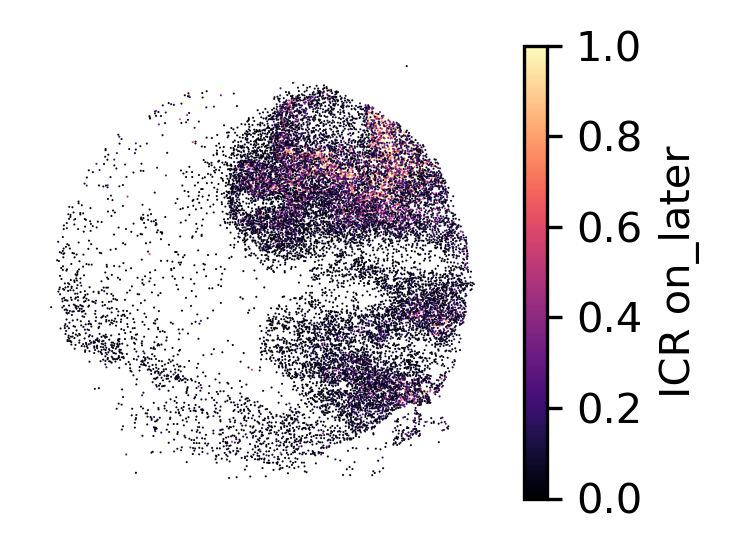

In [9]:
plot_utils.plot_spatial_var(map_info,
                 adata_sample,
                 summ,
                 label='ICR on_later',
                 vmax = 1,path="icr_on_later.pdf"
                )

## plot log lib

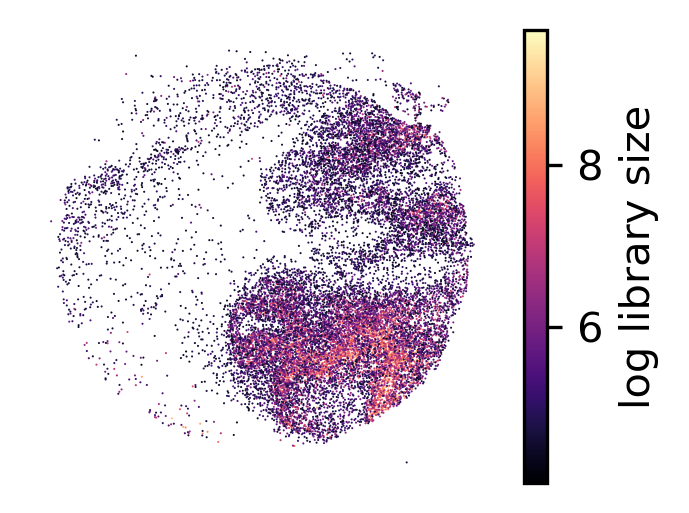

In [8]:
plot_utils.plot_spatial_var(map_info,
                 adata_sample,
                 log_lib,
                 label='log library size'
                )

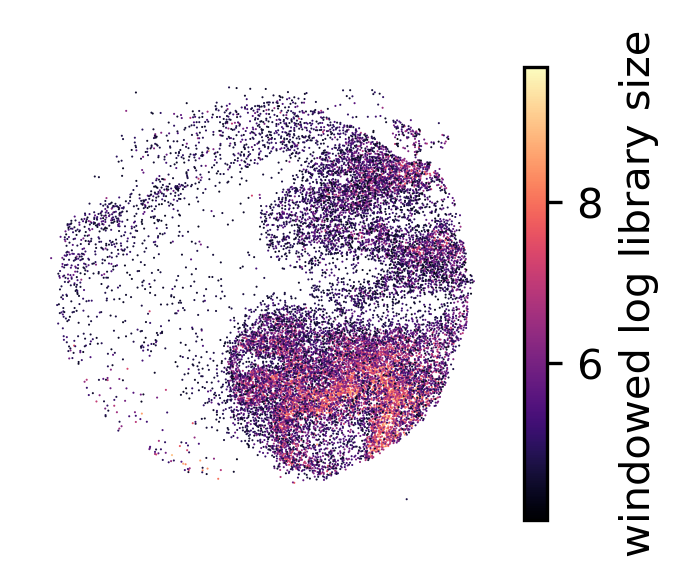

In [9]:
plot_utils.plot_spatial_var(map_info,
                 adata_sample,
                 win_loglib,
                 label='windowed log library size'
                )

## plot raw gene expression

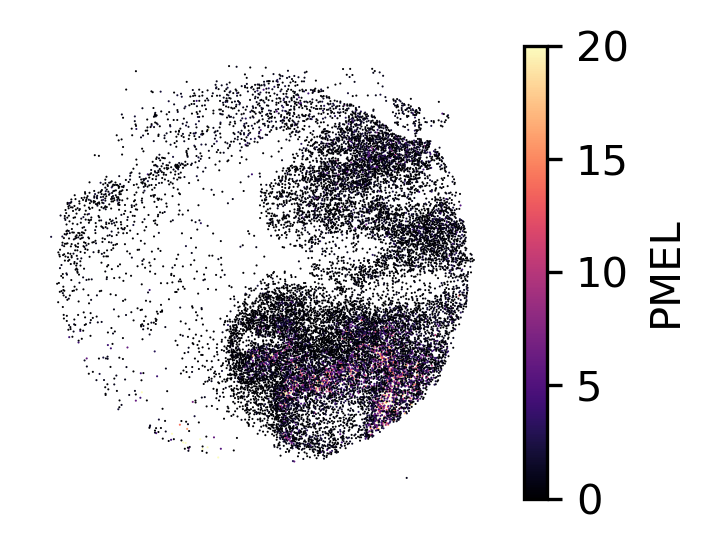

In [10]:
plot_gene_name = 'PMEL'
plot_utils.plot_spatial_var(map_info,
                 adata_sample,
                 adata_sample.to_df().loc[:,plot_gene_name],
                 label=plot_gene_name,
                 vmax=20
                )

## prepare input (prior, anchor spots and data)

In [10]:
adata_sample_normed = adata_sample_pre

In [11]:
# make sure the signature gene name is matched with expression matrix
adata_sample = utils.get_adata_wsig(adata_sample, gene_sig)
adata_sample_normed = utils.get_adata_wsig(adata_sample_normed, gene_sig)

# make sure the signature gene name is matched with expression matrix
#sig_mean = utils.get_sig_mean(adata_sample, gene_sig, log_lib)
sig_mean = utils.get_sig_mean(adata_sample, gene_sig, log_lib)
#sig_mean = sig_mean.fillna(0)

the number of original variable genes in the dataset (1999,)
the number of siganture genes in the dataset (636,)
after filter out some genes in the signature not in the var_names ... (573,)
after filter out some genes not highly expressed in the signature ... (569,)
combine the varibale and siganture, the total unique gene number is ... 2518
the number of original variable genes in the dataset (1999,)
the number of siganture genes in the dataset (636,)
after filter out some genes in the signature not in the var_names ... (573,)
after filter out some genes not highly expressed in the signature ... (569,)
combine the varibale and siganture, the total unique gene number is ... 2518


In [12]:
from scipy.stats import zscore
sig_mean = sig_mean+1e-12
sig_mean_zscore = sig_mean.apply(zscore,axis=0)
sig_mean_zscore[sig_mean_zscore<0]=0 
#sig_mean_zscore = sig_mean_zscore-sig_mean_zscore.min()
sig_mean_zscore = sig_mean_zscore.fillna(0)

In [13]:
pure_spots, pure_dict, pure_idx = utils.get_anchor_spots(adata_sample,
                                               sig_mean_zscore,#sig_mean_zscore,
                                               v_low = 10,#10,#10, 
                                               v_high = 95,#95,#99,
                                               n_anchor = 60#60#60
                                              )

/Users/joyfan/Desktop/run_starfysh/starfysh/utils.py:244: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  pure_spots = np.transpose(sig_mean.loc[highq_spots,:].index[(-np.array(sig_mean.loc[highq_spots,:])).argsort(axis=0)[:n_anchor,:]])


## Run starfysh

In [14]:
alpha_min = 0
for col_idx in np.array(sig_mean.columns):
    if (1/(sig_mean.loc[pure_dict[col_idx],:]/sig_mean.loc[pure_dict[col_idx],:].sum())[col_idx]).max()>alpha_min:
        alpha_min = (1/(sig_mean.loc[pure_dict[col_idx],:]/sig_mean.loc[pure_dict[col_idx],:].sum())[col_idx]).max()


model = starfysh.AVAE(
            adata = adata_sample,
            gene_sig = gene_sig,
            alpha_min = alpha_min,
            win_loglib = win_loglib,
          )

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)
lr=0.001
optimizer = optim.Adam(model.parameters(), lr=lr)

trainset = dataloader.VisiumDataset(adata=adata_sample, 
                                    gene_sig_exp_m=sig_mean_zscore,#sig_mean_zscore,
                                    adata_pure = pure_idx,
                                    library_n = win_loglib
                                    )

trainloader = DataLoader(trainset, 
                         batch_size=32, 
                         shuffle=True)

epochs= 30
train_loss = []
corr_list_all = []
for epoch in range(epochs):
    (train_epoch_loss, 
     train_reconst, 
     train_z, 
     train_c, 
     train_n, 
     corr_list) = starfysh.train(model, 
                                 trainloader, 
                                 trainset, 
                                 device, 
                                 optimizer)
    train_loss.append(train_epoch_loss)
    torch.cuda.empty_cache()
    corr_list_all.append(corr_list)
    if (epoch+1) % 1 == 0:
            print ("Epoch[{}/{}], train_loss: {:.4f}, train_reconst: {:.4f}, train_z: {:.4f},train_c: {:.4f},train_n: {:.4f}".format(epoch+1, epochs, train_epoch_loss, train_reconst, train_z, train_c, train_n))  
print('finish lower training rate')

/Users/joyfan/miniconda3/envs/labenv/lib/python3.6/site-packages/torch/nn/modules/container.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)
/Users/joyfan/miniconda3/envs/labenv/lib/python3.6/site-packages/torch/distributions/distribution.py:46: UserWarning: <class 'starfysh.starfysh.NegBinom'> does not define `arg_constraints`. Please set `arg_constraints = {}` or initialize the distribution with `validate_args=False` to turn off validation.
  'with `validate_args=False` to turn off validation.')


Epoch[1/30], train_loss: 4921.9589, train_reconst: 234.8160, train_z: 12.1796,train_c: 4652.1829,train_n: 22.7805
Epoch[2/30], train_loss: 2828.3308, train_reconst: 184.7192, train_z: 6.1168,train_c: 2622.1879,train_n: 15.3069
Epoch[3/30], train_loss: 2230.7742, train_reconst: 182.2778, train_z: 5.1463,train_c: 2032.0707,train_n: 11.2794
Epoch[4/30], train_loss: 2051.4798, train_reconst: 181.6974, train_z: 5.3396,train_c: 1856.7371,train_n: 7.7057
Epoch[5/30], train_loss: 1924.2864, train_reconst: 180.5363, train_z: 5.3501,train_c: 1732.9349,train_n: 5.4652
Epoch[6/30], train_loss: 2025.3660, train_reconst: 178.9932, train_z: 5.3050,train_c: 1836.6039,train_n: 4.4638
Epoch[7/30], train_loss: 1737.2487, train_reconst: 178.2796, train_z: 5.1608,train_c: 1550.1840,train_n: 3.6244
Epoch[8/30], train_loss: 1633.4092, train_reconst: 177.6671, train_z: 5.0562,train_c: 1447.4243,train_n: 3.2616
Epoch[9/30], train_loss: 1525.5193, train_reconst: 176.7265, train_z: 4.9061,train_c: 1341.0448,trai

## Basic downstream analysis

In [17]:
lib_low=torch.exp(torch.Tensor([5.0])).to(device)
inference_outputs, generative_outputs, px = starfysh.model_eval(model,adata_sample, sig_mean, device,log_lib,lib_low)
u = post_analysis.get_z_umap(inference_outputs)
u = pd.DataFrame(u,columns=['umap1','umap2'])
u.index = map_info.index

/Users/joyfan/Desktop/run_starfysh/starfysh/starfysh.py:472: FutureWarning: Support for multi-dimensional indexing (e.g. `obj[:, None]`) is deprecated and will be removed in a future version.  Convert to a numpy array before indexing instead.
  library_i = torch.Tensor(library_i[:,None])
/Users/joyfan/miniconda3/envs/labenv/lib/python3.6/site-packages/torch/nn/modules/container.py:141: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  input = module(input)
/Users/joyfan/miniconda3/envs/labenv/lib/python3.6/site-packages/torch/distributions/distribution.py:46: UserWarning: <class 'starfysh.starfysh.NegBinom'> does not define `arg_constraints`. Please set `arg_constraints = {}` or initialize the distribution with `validate_args=False` to turn off validation.
  'with `validate_args=False` to turn off validation.')


#### 1. gene sig mean vs. inferred prop

In [17]:
sig_mean_n_df = pd.DataFrame(np.array(sig_mean)/(np.sum(np.array(sig_mean),axis=1,keepdims=True)+1e-5),
                                 columns=sig_mean.columns,
                                 index = sig_mean.index
                                )

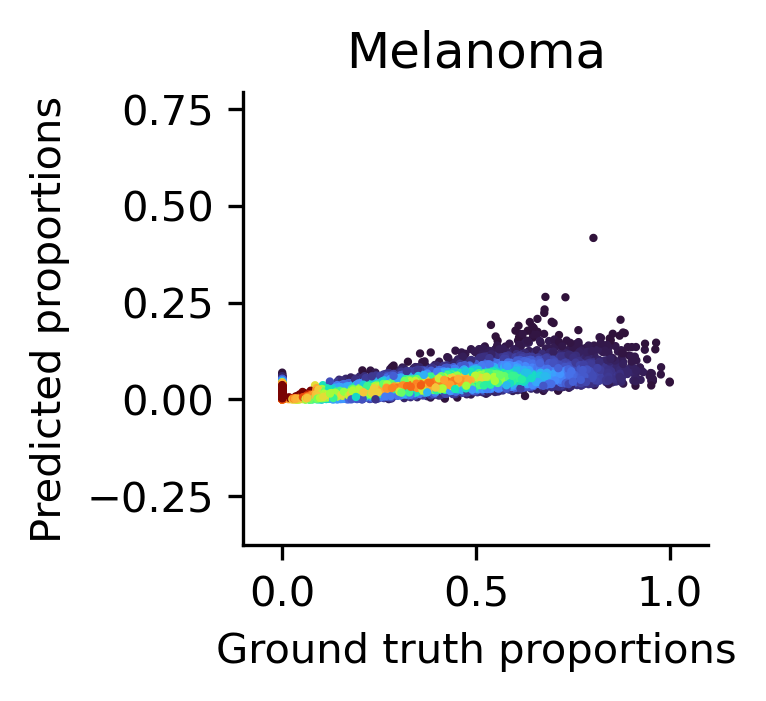

In [89]:
post_analysis.pred_prop_scatter(inference_outputs,
                                    sig_mean_n_df,
                                    idx=24)

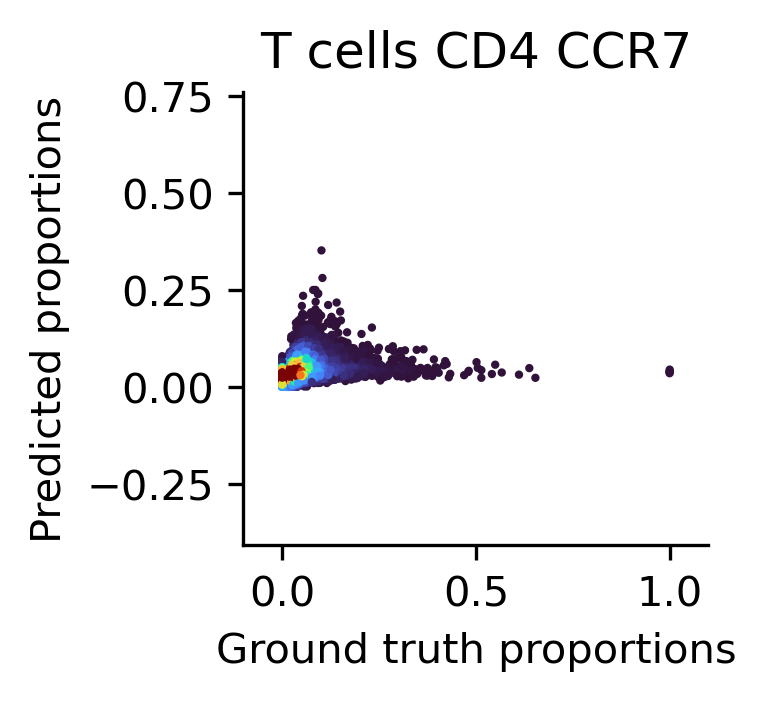

In [19]:
post_analysis.pred_prop_scatter(inference_outputs,
                                    sig_mean_n_df,
                                    idx=0)

In [19]:
if data_folder =='simu_data':
    post_analysis.plot_type_all(inference_outputs,np.array(u),proportions)

In [20]:
if data_folder =='simu_data':
    post_analysis.get_corr_map(inference_outputs,sig_mean,proportions)

#### 2. inferred density

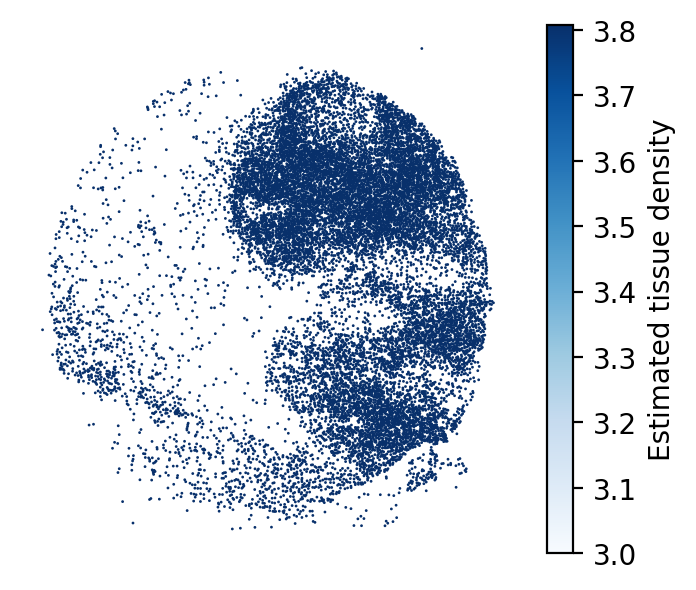

In [20]:
plot_utils.pl_spatial_inf_feature(adata_sample,
                   map_info,
                   inference_outputs,
                   feature='ql_m',
                   idx=0,
                   plt_title='',
                   label='Estimated tissue density',
                   s=4,
                   vmax=3
                   )

#### 3. inferred prop. on umap (adjust idx number for different cell types)

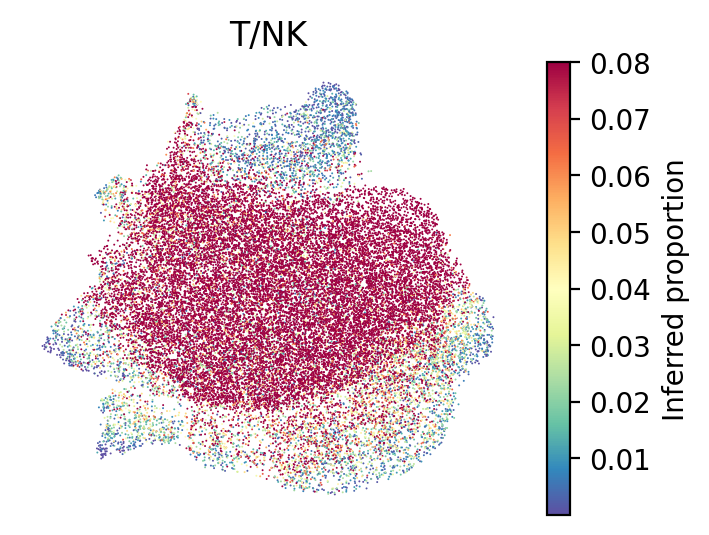

In [43]:
idx=0



plot_utils.pl_umap_feature(adata_sample,
                   u,
                   feature=np.array(inference_outputs['qc_m'].detach().cpu().numpy()),#/np.sum(np.array(sig_mean),axis=1,keepdims=True),
                   idx=idx,
                   plt_title=gene_sig.columns[idx],
                   label='Inferred proportion',
                   s=2,
                   vmax=0.08
                   )

#### 4. inferred prop. on spatial loc (adjust idx number for different cell types)

In [15]:
gene_sig

,T cells CD4 CCR7,T cells CD4 IL7R,T cells CD4 Tfh CXCL13,T regs FOXP3,B cells memory,B cells naive,NK,Macrophage M1,Macrophage M2,Endothelial,...,pDC,Terminal exhaustion,Precursor exhaustion,CAFs MSC iCAF-like,CAFs myCAF-like,PVL differentiated,PVL immature,Normal epithelial,Plasmablasts,Melanoma
0,CCR7,IL7R,CXCL13,TNFRSF4,MS4A1,CD79A,GNLY,C1QB,CXCL10,ACKR1,...,IL3RA,CD3G,TCF7,APOD,COL1A1,ACTA2,CCL19,KRT14,IGKV3-15,PMEL
1,LTB,ANXA1,NMB,LTB,CD79A,TCL1A,XCL1,C1QA,C1QB,FABP4,...,LILRA4,FASLG,MS4A4A,DCN,COL1A2,TAGLN,RGS5,KRT17,IGHG1,MLANA
2,IL7R,CXCR4,NR3C1,IL32,CD83,MS4A1,XCL2,C1QC,C1QC,PLVAP,...,CD123,ID2,TNFSF8,PTGDS,COL3A1,MYL9,IGFBP7,LTF,IGKV1-5,MITF
3,SARAF,KLRB1,DUSP4,BATF,CD37,CD37,AREG,CCL3,CXCL9,RAMP2,...,TCF4,LAG3,CXCL10,CFD,LUM,TPM2,NDUFA4L2,KRT15,IGKV3-20,NaN
4,SELL,TNFAIP3,TNFRSF18,FOXP3,BANK1,CD74,KLRD1,CCL3L3,C1QA,VWF,...,IRF7,RGS1,EEF1B2,LUM,SFRP2,NDUFA4L2,CCL2,PTN,IGKV3-11,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
66,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
67,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
68,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
69,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


/Users/joyfan/Desktop/run_starfysh/starfysh/plot_utils.py:109: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,axs= plt.subplots(1,1,figsize=(4,3),dpi=200)


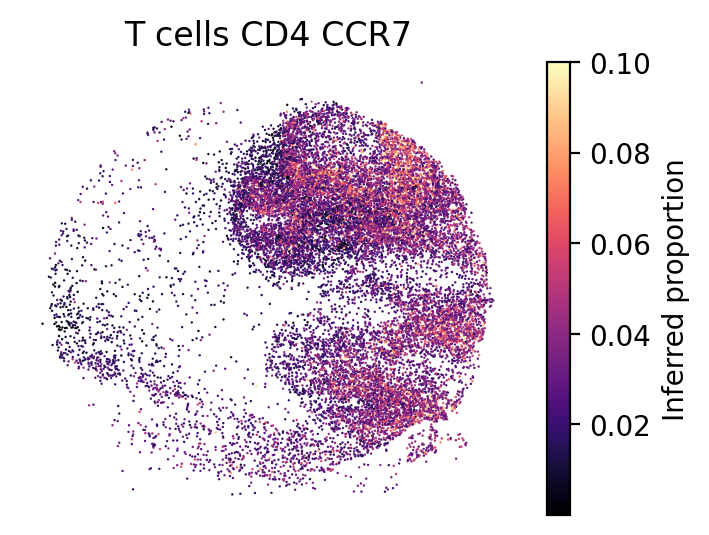

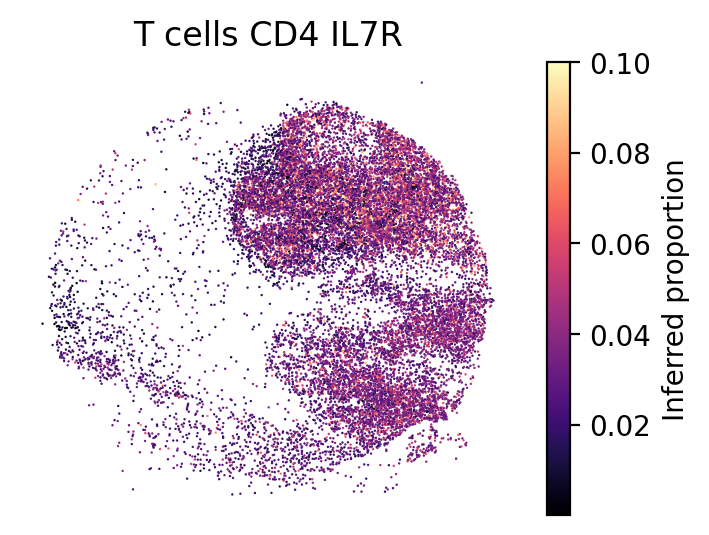

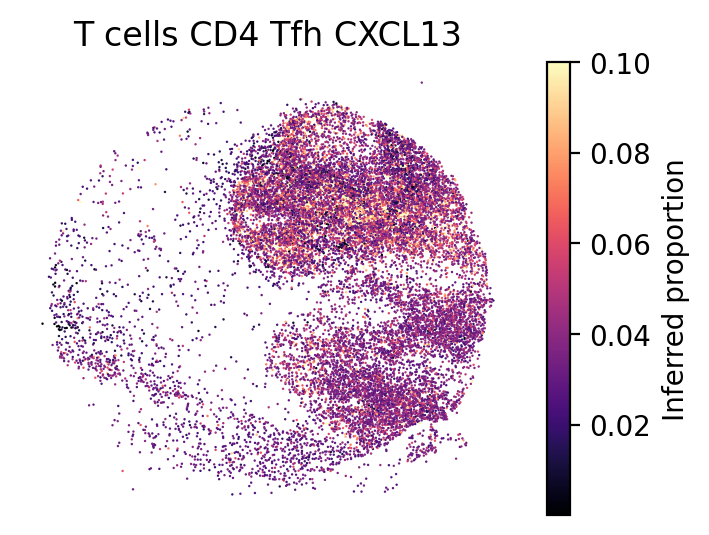

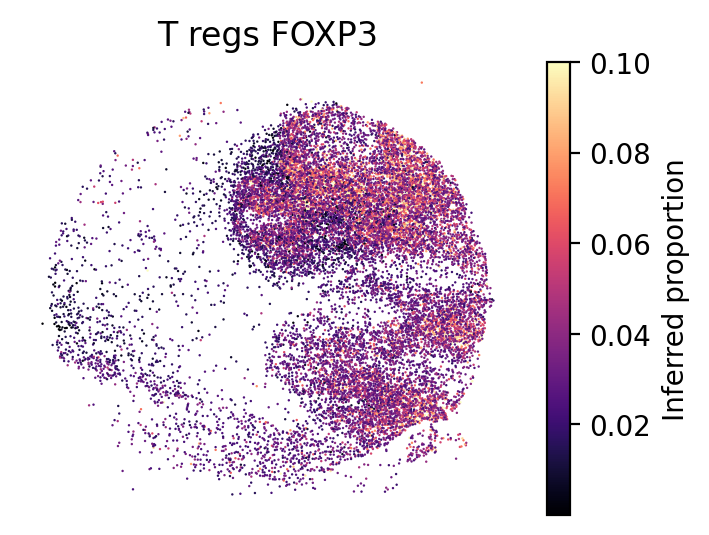

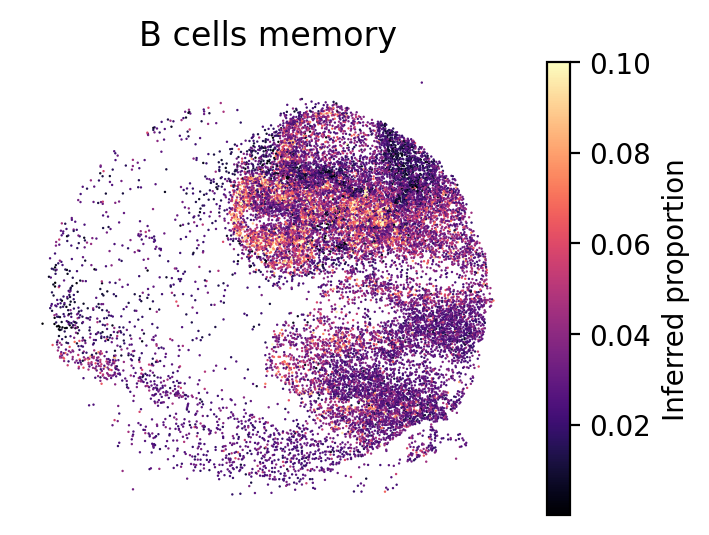

...

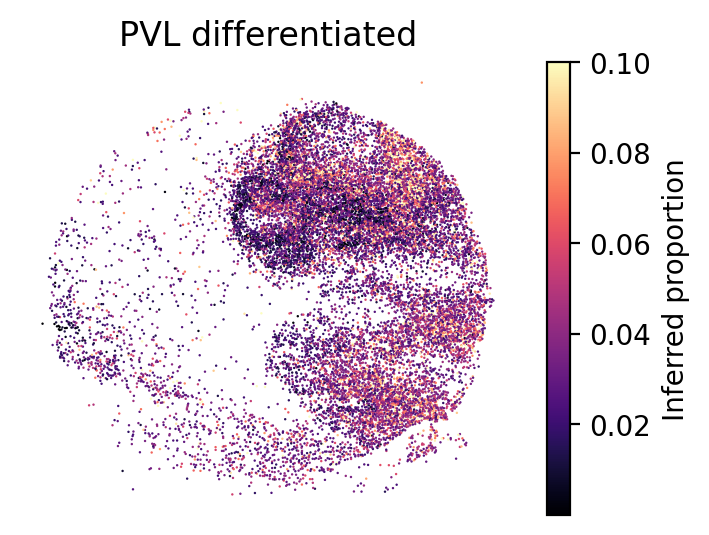

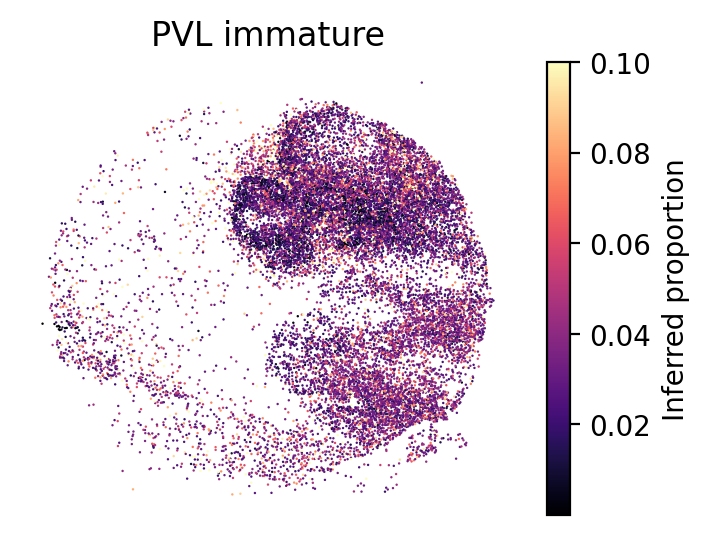

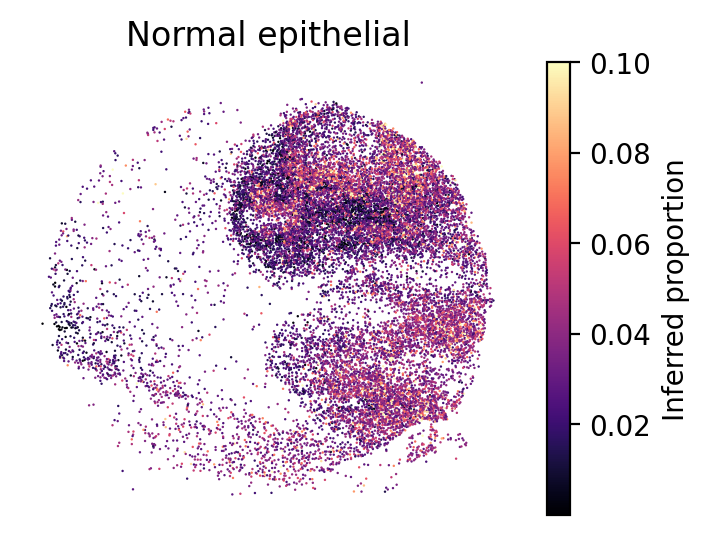

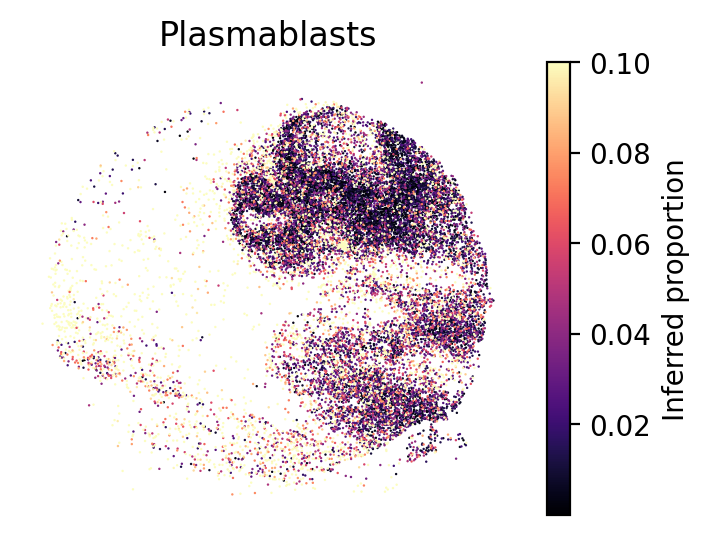

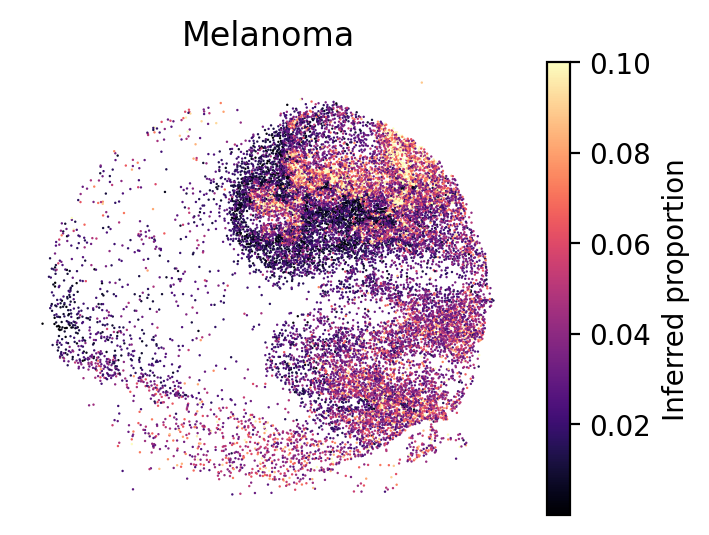

In [19]:
for i in range(gene_sig.shape[1]):
    plot_utils.pl_spatial_feature(adata_sample,
                       map_info,
                       feature=np.array(inference_outputs['qc_m'].detach().cpu().numpy()),
                       idx=i,
                       plt_title=gene_sig.columns[i],
                       label='Inferred proportion',
                       s=3,
                       vmax=0.1, path='figures/on_later_'+gene_sig.columns[i]
                       )


In [28]:
model.alpha

Parameter containing:
tensor([495.5222, 767.3705,  87.4324, 131.0010, 306.8056, 633.5967, 489.1432,
        895.7648, 454.9588, 631.9329, 347.7653, 400.8643,  22.1469, 168.0002,
        293.0026, 517.6083, 696.7100, 798.9351, 160.3449, 281.7472, 680.9212,
        914.3892, 396.7209, 873.2192, 418.8300, 552.3292], requires_grad=True)

In [26]:
dist = {
        'px_rate': generative_outputs['px_rate'].detach().cpu().numpy().tolist(),
        'px_r': generative_outputs['px_r'].detach().cpu().numpy().tolist(),
        'pc_p': generative_outputs['pc_p'].detach().cpu().numpy().tolist(),

        'qc_m': inference_outputs['qc_m'].detach().cpu().numpy().tolist(),
        'qc': inference_outputs['qc'].detach().cpu().numpy().tolist(),
        'qz_m': inference_outputs['qz_m'].detach().cpu().numpy().tolist(),
        'qz_m_ct': inference_outputs['qz_m_ct'].detach().cpu().numpy().tolist(),
        'qz_logv': inference_outputs['qz_logv'].detach().cpu().numpy().tolist(),
        'qz_logv_ct': inference_outputs['qz_logv_ct'].detach().cpu().numpy().tolist(),
        'qz': inference_outputs['qz'].detach().cpu().numpy().tolist(),
        'ql_m': inference_outputs['ql_m'].detach().cpu().numpy().tolist(),
        'ql_logv': inference_outputs['ql_logv'].detach().cpu().numpy().tolist(),
        'ql': inference_outputs['ql'].detach().cpu().numpy().tolist(),
}


import json
#with open('/content/drive/MyDrive/SpatialModelProject/model_test_colab/results/02_factor/'+sample_id+'_factor.json', 'w') as fp:
with open('results/02_factor/'+sample_id+'_factor.json', 'w') as fp:

    json.dump(dist, fp)